In [20]:
#для обработки данных в виде таблицы
import time
from queue import Queue
import  queue
import threading

import numpy as np
import pandas as pd
from tqdm import tqdm
import os
from glob import glob
import cv2

#удаляем дубли и отрисовка
import hashlib
from PIL import Image, ImageChops

from matplotlib.pyplot import imread, imshow
import matplotlib.pyplot as plt 
import matplotlib.gridspec as gridspec
%matplotlib inline

In [7]:
#os.chdir("C:\\Users\\a.dubinets\\Desktop\\Обучение\\Mushrooms") 
os.chdir(r"c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\temp_image") 
os.getcwd()

'c:\\Users\\a.dubinets\\Desktop\\Обучение\\Mushrooms\\Dataset\\temp_image'

# Переименуем папки и файлы.
### Для увеличения datasets и увеличения качества модели, мы делали 2 прогона скачивания фотогорафий. На русском и на английском. Те фото, что скачивались на английском нам нужно переименовать и дополнить уже существующий датасет. 


In [6]:
df=pd.read_excel(r'C:\\Users\\a.dubinets\\Desktop\\Обучение\\Mushrooms\\Result\\mushroom.xlsx') 
df.head(5)

,title,lat,link,desciption
0,Свинушка тонкая,Paxillus involutus,https://wikigrib.ru/svinushka-tonkaya/,\nСвинушка тонкая (лат. Paxillus involutus) ил...
1,Жёлчный гриб,Tylopilus felleus,https://wikigrib.ru/zhelchnyj-gribgorchak/,\nВоплощение разочарования любого грибника – Л...
2,Рядовка лиловоногая,Lepista saeva,https://wikigrib.ru/ryadovka-lilovonogaya/,\n\nХарактеристики:\nГруппа: пластинчатыеПласт...
3,Рядовка тополёвая,Tricholoma populinum,https://wikigrib.ru/ryadovka-topolevaya/,\n\nХарактеристики:\nГруппа: пластинчатыеЦвет:...
4,Опёнок осенний,Armillaria mellea; Armillaria borealis,https://wikigrib.ru/openok-osennij/,\n\nХарактеристики:\nГруппа: пластинчатыеПласт...


In [ ]:
# Переименуем все файлы внутри папок, для того чтобы все названия были единообразные. 
os.chdir(r'c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\temp_image')
content = os.listdir()
df_fix = df.copy()
df_fix['lat_fix'] = df_fix['lat'].str.replace(' ', '_')
df_fix['title_fix'] = df_fix['title'].str.replace(' ', '_')
df_fix = df_fix.loc[df_fix['lat_fix'].isin(content)]
df_fix[['lat_fix','title_fix']]

for folder in os.listdir():
    df_fix2 = df_fix.copy()
    df_fix2 = df_fix2.loc[df_fix2['lat_fix'] == folder]
    new_folder = df_fix2['title'].tolist()[0]
#    print(folder, new_folder)
    for file in os.listdir(folder):
        old = file
        old_fix = old.replace(' ', '_')
        new = old_fix.replace(folder, new_folder+'_v2')
        print(folder,'file: ', old, new)
#        os.rename(old,  new)

In [15]:
# Переименовывем папки на русский чтобы сопоставить с уже имеющимися.
os.chdir(r'c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\temp_image')
content = os.listdir()
df_fix = df.copy()
df_fix['lat_fix'] = df_fix['lat'].str.replace(' ', '_')
df_fix['title_fix'] = df_fix['title'].str.replace(' ', '_')
df_fix = df_fix.loc[df_fix['lat_fix'].isin(content)]
df_fix[['lat_fix','title_fix']]

for index, row in df_fix.iterrows():
    print(row['lat_fix'], "Гриб_" + row['title_fix'])
    try:
        os.rename(row['lat_fix'], "Гриб_" + row['title_fix'])
    except:
        pass    

Agaricus_campestris Гриб_Шампиньон_обыкновенный
Chroogomphus_rutilus Гриб_Мокруха_пурпуровая
Lactarius_torminosus Гриб_Волнушка_розовая
Lepiota_brunneoincarnata Гриб_Зонтик_чешуйчатый
Pleurotus_ostreatus Гриб_Вёшенка_устричная
Agaricus_silvaticus Гриб_Шампиньон_лесной_(Благушка)
Rubroboletus_pulcherrimus Гриб_Боровик_прекрасный
Tricholoma_columbetta Гриб_Рядовка_голубиная
Lepista_sordida Гриб_Рядовка_грязная
Cortinarius_esculentus Гриб_Паутинник_съедобный_(Толстушка)
Lactarius_volemus Гриб_Подмолочник
Tricholoma_imbricatum Гриб_Рядовка_чешуйчатая
Russula_nobilis Гриб_Сыроежка_Мэйра
Galerina_marginata Гриб_Галерина_окаймленная
Stropharia_aeruginosa Гриб_Строфария_сине-зеленая
Panaeolina_foenisecii Гриб_Сенный_навозник
Clitocybe_robusta Гриб_Говорушка_дымчатая_форма_белая
Butyriboletus_regius Гриб_Боровик_королевский
Mutinus_ravenelii Гриб_Мутинус_Равенелли
Russula_delica Гриб_Подгруздок_белый
Chalciporus_piperatus Гриб_Перечный_гриб
Xerocomellus_chrysenteron Гриб_Моховик_пёстрый
Cratere

Amanita_fulva Гриб_Поплавок_желто-коричневый
Armillaria_cepistipes Гриб_Опенок_луковичноногий
Hygrophorus_agathosmus Гриб_Гигрофор_благоуханный
Russula_cyanoxantha Гриб_Сыроежка_сине-желтая
Lactarius_porninsis Гриб_Млечник_оранжевый
Mycenastrum_corium Гриб_Миценаструм_кожистый
Clavariadelphus_ligula Гриб_Рогатик_язычковый
Hygrophorus_camarophyllus Гриб_Гигрофор_чёрный
Russula_illota Гриб_Сыроежка_Морзе
Hebeloma_fastibile Гриб_Гебелома_недоступная
Melanoleuca_brevipes Гриб_Меланолеука_коротконожковая
Pseudohydnum_gelatinosum Гриб_Псевдоежовик_студенистый_(Ложноежовик)
Peziza_varia Гриб_Пецица_изменчивая
Psiloboletinus_lariceti Гриб_Моховик_лиственничный
Lactarius_subdulcis Гриб_Краснушка
Elaphomyces_granulatus Гриб_Трюфель_олений
Agaricus_bitorquis Гриб_Шампиньон_двукольцевой
Cortinarius_bolaris Гриб_Паутинник_ленивый
Russula_albonigra Гриб_Подгруздок_бело-черный
Aureoboletus_moravicus Гриб_Моховик_моравский
Agrocybe_dura Гриб_Полевик_жёсткий
Gomphus_clavatus Гриб_Лисичка_булавовидная
T

Cortinarius_delibutus Гриб_Паутинник_намазанный
Cortinarius_erythrinus Гриб_Паутинник_ярко-красный
Psathyrella_corrugis Гриб_Псатирелла_морщинистая
Marasmius_haematocephalus Гриб_Негниючник_кровавоголовый
Puccinia_recondita Гриб_Бурая_ржавчина_пшеницы
Rhodocollybia_prolixa Гриб_Коллибия_изогнутая
Clavulinopsis_helvola Гриб_Клавулинопсис_палевый
Hydnellum_suaveolens Гриб_Гиднеллум_пахучий
Marasmius_rotula Гриб_Негниючник_колёсовидный
Hypomyces_viridis Гриб_Гипомицес_зелёный
Coprinopsis_romagnesiana Гриб_Навозник_Романьези
Pseudocolus_fusiformis Гриб_Цветохвостник_яванский
Leratiomyces_ceres Гриб_Лерациомицес_церера
Alloclavaria_purpurea Гриб_Аллоклавария_пурпуровая
Helvella_queletii Гриб_Гельвелла_Келе
Mycena_polygramma Гриб_Мицена_полосатоножковая
Hohenbuehelia_petaloides Гриб_Гоенбуелия_лепестковидная
Tarzetta_cupularis Гриб_Тарцетта_бочковидная
Chlorociboria_aeruginascens Гриб_Хлороцибория_сине-зеленоватая
Hydnellum_ferrugineum Гриб_Гиднеллум_ржавчинный
Mycena_viscosa Гриб_Мицена_кле

## У нас при скачивании собралось много дублей. Давайте их удалим.

In [65]:
# remove dublicate Images Using Hashing
def file_hash(filepath):
    with open(filepath, 'rb') as f:
        return md5(f.read()).hexdigest()

In [66]:
path = r'c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced'

rez = sorted(os.listdir(path))
for n, item in tqdm(enumerate(rez)):
    msh_path = path+'\\'+item
    os.chdir(msh_path)
    file_list = os.listdir()
    print(n+1, len(file_list), msh_path)
    
    duplicates = []
    hash_keys = dict()
    for index, filename in  enumerate(os.listdir('.')):  #listdir('.') = current directory
        if os.path.isfile(filename):
            with open(filename, 'rb') as f:
                filehash = hashlib.md5(f.read()).hexdigest()
            if filehash not in hash_keys: 
                hash_keys[filehash] = index
            else:
                duplicates.append((index,hash_keys[filehash]))
    for index in duplicates:
        os.remove(file_list[index[0]])

3it [00:00, 15.75it/s]

1 180 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Абортипорус
2 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Агроцибе_стоповидный
3 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Агроцибе_эребия


5it [00:00, 12.47it/s]

4 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Алеврия_оранжевая
5 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аллоклавария_пурпуровая


7it [00:00, 11.47it/s]

6 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Альбатреллус_гребенчатый
7 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Альбатреллус_краснеющий
8 229 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Альбатреллус_синепоровый
9 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Альбатреллус_сирени


11it [00:00, 10.40it/s]

10 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Альбатреллус_сливающийся_(Альбатреллус_сросшийся)
11 151 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Альбатреллус_тянь-шаньский


13it [00:01, 10.82it/s]

12 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Антракобия_маурилабра
13 135 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аррения_лопатчатая
14 125 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аскоболус_навозный


15it [00:01, 11.07it/s]

15 169 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аскокорине_мясная
16 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аскокорине_цилихниум
17 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Астерофора_дождевиковая


19it [00:01, 11.18it/s]

18 152 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аурантипорус_расщепляющийся
19 172 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аурикулариопсис_уховидный
20 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аурикулярия_густоволосистая


21it [00:01, 10.23it/s]

21 176 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аурикулярия_извилистая
22 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аурикулярия_уховидная_(Иудино_ухо)


23it [00:02, 10.64it/s]

23 146 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Аурискальпиум_обыкновенный
24 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Баттаррея_веселковая
25 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белонавозник_Бедхэма


25it [00:02, 10.45it/s]

26 230 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белонавозник_Бирнбаума
27 237 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белонавозник_Пилата


29it [00:02,  9.88it/s]

28 161 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белопаутинник_луковичный
29 243 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белосвинуха_горечавковая


31it [00:02, 10.18it/s]

30 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белосвинуха_трёхцветная
31 170 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белошампиньон_длиннокорневой
32 244 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белошампиньон_краснопластинчатый
33 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белый_гриб


35it [00:03, 10.90it/s]

34 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белый_гриб_берёзовый
35 53 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белый_гриб_бронзовый
36 134 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белый_гриб_дубовый_(Боровик_сетчатый)
37 51 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белый_гриб_сетчатый


38it [00:03, 12.23it/s]

38 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белый_гриб_сосновый
39 168 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Белый_домовой_гриб
40 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Беоспора_мышехвостая


42it [00:03, 11.65it/s]

41 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Биспорелла_лимонная
42 154 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Биссонектрия_наземная


44it [00:04, 11.22it/s]

43 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Бледная_поганка
44 176 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Блюдцевик_жилковатый


46it [00:04, 11.59it/s]

45 160 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Бокальчик_Олла
46 140 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Бокальчик_гладкий
47 167 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Бокальчик_навозный


48it [00:04, 11.51it/s]

48 164 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Бокальчик_полосатый
49 132 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Болет_бронзовый_(Боровик_бронзовый)
50 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Болет_красивоножковый


52it [00:04, 11.00it/s]

51 138 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Болет_полубронзовый
52 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Болет_пурпурный_(Боровик_пурпурный)
53 180 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Болетин_азиатский


54it [00:04, 10.74it/s]

54 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Болетин_болотный
55 68 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Болетопсис_бело-чёрный
56 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Болетопсис_серый


56it [00:05, 11.33it/s]

57 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Больбитус_золотистый
58 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_Берроуза


60it [00:05, 11.25it/s]

59 168 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_Фехтнера
60 130 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_Фроста
61 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_волчий


62it [00:05, 10.58it/s]

62 228 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_двухцветный
63 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_жёлтый


64it [00:05, 10.55it/s]

64 183 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_золотистый
65 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_коренящийся
66 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_королевский


68it [00:06, 10.48it/s]

67 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_красивоокрашенный
68 176 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_ле_Галь


70it [00:06, 11.85it/s]

69 68 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_неопушённый
70 157 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_пороспоровый
71 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_прекрасный
72 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_придаточковый


74it [00:06, 10.98it/s]

73 178 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_розово-пурпурный
74 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Боровик_розовокожий


76it [00:06, 11.24it/s]

75 137 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Бруннипила_скрытая
76 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Булгария_инквинанс
77 148 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Бурая_ржавчина_пшеницы


78it [00:07, 11.51it/s]

78 156 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Бьеркандера_опаленная
79 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Валуй
80 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Весёлка_Равенелли


80it [00:07, 10.62it/s]

81 229 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Весёлка_Хадриана
82 176 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Весёлка_обыкновенная


82it [00:07, 10.06it/s]

83 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вешенка_рожковидная
84 156 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Виннея_американская


84it [00:07,  9.83it/s]

85 232 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волкартия
86 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волнушка_белая


87it [00:08,  8.92it/s]

87 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волнушка_розовая
88 132 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волоконница_волокнистая
89 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волоконница_земляная


90it [00:08,  9.02it/s]

90 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волоконница_острая
91 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волоконница_патуйяра


92it [00:08,  8.09it/s]

92 257 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волоконница_похожая
93 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волоконница_разорванная


94it [00:09,  8.22it/s]

94 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волоконница_репчатая
95 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Волоконница_трещиноватая


96it [00:09,  8.59it/s]

96 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вольвариелла_паразитическая
97 156 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вольвариелла_серо-голубоватая
98 177 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вольвариелла_слизистоголовая


100it [00:09, 10.31it/s]

99 60 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вольвариелла_хвойная
100 183 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вольвариелла_шелковистая
101 124 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вороночник_рожковидный
102 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вёшенка_дубовая


102it [00:09,  9.56it/s]

103 128 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вёшенка_королевская_(Еринги
104 174 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вёшенка_лимонная


105it [00:10,  7.99it/s]

105 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вёшенка_лёгочная


107it [00:10,  8.52it/s]

106 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вёшенка_оранжевая
107 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вёшенка_осенняя
108 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вёшенка_покрытая
109 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вёшенка_степная


111it [00:10,  9.41it/s]

110 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вёшенка_сёмгово-соломенная
111 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Вёшенка_устричная


112it [00:10,  9.33it/s]

112 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Галерина_Болотная
113 210 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Галерина_лентовидная


114it [00:11,  8.74it/s]

114 233 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Галерина_моховая
115 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Галерина_окаймленная


116it [00:11,  9.05it/s]

116 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Галерина_сфагновая
117 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ганодерма_смолистая
118 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ганодерма_южная


120it [00:11, 10.07it/s]

119 165 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гапалопилус_красноватый
120 160 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Геаструм_тройной


121it [00:11,  9.80it/s]

121 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гебелома_горчичная
122 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гебелома_клейкая_(Валуй_ложный)


124it [00:12,  9.98it/s]

123 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гебелома_корневая
124 177 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гебелома_недоступная


125it [00:12,  9.71it/s]

125 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гебелома_опоясанная
126 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гебелома_углелюбивая


127it [00:12,  9.40it/s]

127 205 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гельвелла_Келе
128 249 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Геопора_Самнера


129it [00:12,  9.06it/s]

129 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Геопора_песчаная
130 205 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Геопора_сосновая


131it [00:13,  8.97it/s]

131 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гепиния_гельвеллоидная
132 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гетеробазидион_многолетний


133it [00:13,  8.48it/s]

133 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_Персона
134 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_благоуханный


135it [00:13,  7.94it/s]

135 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_буковый
136 174 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_девичий


137it [00:13,  8.55it/s]

137 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_дубравный
138 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_желтовато-белый


139it [00:13,  8.38it/s]

139 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_золотистый
140 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_краснеющий


141it [00:14,  7.82it/s]

141 269 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_лиственничный
142 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_луговой


143it [00:14,  8.11it/s]

143 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_оливково-белый
144 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_поздний


145it [00:14,  7.92it/s]

145 239 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_попугай_(Гигрофор_пёстрый)
146 62 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_поэтичный
147 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_пятнистый


148it [00:15,  9.53it/s]

148 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_ранний
149 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_розоватый


150it [00:15,  7.96it/s]

150 239 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_снежно-белый
151 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_сыроежковый


152it [00:15,  7.42it/s]

152 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигрофор_чёрный
153 220 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигроцибе_Восковая


154it [00:16,  5.92it/s]

154 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигроцибе_Красивая
155 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигроцибе_алая


156it [00:16,  5.87it/s]

156 248 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигроцибе_дубовая


157it [00:16,  5.88it/s]

157 239 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигроцибе_жёлто-зелёная_(Гигроцибе_темно-хлорная)
158 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигроцибе_киноварно-красная


159it [00:16,  6.58it/s]

159 180 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигроцибе_коническая
160 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигроцибе_остроконическая


161it [00:17,  7.80it/s]

161 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигроцибе_пунцовая
162 269 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гигроцибе_турунда


163it [00:17,  7.46it/s]

163 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гиднеллум_Пека
164 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гиднеллум_голубой


166it [00:17,  8.49it/s]

165 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гиднеллум_оранжевый
166 228 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гиднеллум_пахучий


167it [00:17,  8.83it/s]

167 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гиднеллум_ржавчинный
168 155 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гименохета_красно-бурая
169 131 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гименохете_пурпурная


169it [00:17, 10.37it/s]

170 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гимнопил_Юноны
171 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гимнопил_горький


171it [00:18, 10.04it/s]

172 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гимнопил_желтопластинчатый
173 245 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гимнопил_исчезающий


175it [00:18,  9.76it/s]

174 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гимнопил_проникающий
175 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гимнопил_сосновый


176it [00:18,  9.26it/s]

176 255 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гимнопус_водолюбивый
177 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гимнопус_желтопластинчатый


178it [00:18,  8.88it/s]

178 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гипокрея_серно-желтая
179 177 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гипомицес_зелёный


180it [00:19,  8.85it/s]

180 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гипомицес_млечниковый
181 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гипсизигус_ильмовый


182it [00:19,  8.91it/s]

182 229 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гиродон_мерулиусовидный
183 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гиропорус_каштановый


184it [00:19,  7.78it/s]

184 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гиропорус_песчаный
185 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гиропорус_синеющий


186it [00:20,  5.98it/s]

186 154 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гифолома_головообразная
187 239 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гифолома_окаймленная


189it [00:20,  8.19it/s]

188 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Глеофиллум_бревенчатый
189 127 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Глеофиллум_заборный
190 161 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Глеофиллум_пахучий


191it [00:20,  7.47it/s]

191 163 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Глеофиллум_пихтовый
192 146 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Глеофиллум_продолговатый


193it [00:21,  5.28it/s]

193 109 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Глиофор_маслянистый
194 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гнездовка_бесформенная


195it [00:21,  4.27it/s]

195 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_анисовая
196 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_беловатая


197it [00:22,  5.80it/s]

197 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_белёсая
198 229 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_благоухающая


199it [00:22,  6.88it/s]

199 228 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_бледноокрашенная
200 248 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_блюдцевидная


201it [00:22,  7.58it/s]

201 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_булавоногая
202 228 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_буро-жёлтая


202it [00:22,  7.74it/s]

203 180 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_ворончатая
204 239 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_дымчатая_(Рядовка_дымчатая)


205it [00:23,  8.52it/s]

205 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_дымчатая_форма_белая
206 219 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_желобчатая


207it [00:23,  8.37it/s]

207 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_зимняя
208 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_налиственная


209it [00:23,  8.74it/s]

209 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_перевёрнутая
210 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_подогнутая


211it [00:23,  8.66it/s]

211 229 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_слабопахучая
212 178 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Говорушка_снежная


213it [00:23,  9.66it/s]

213 164 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гоенбуелия_лепестковидная
214 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Головач_гигантский


215it [00:24,  9.16it/s]

215 172 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Головач_мешковатый
216 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Головач_продолговатый


217it [00:24,  8.03it/s]

217 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гомфус_чешуйчатый
218 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Горькушка


219it [00:24,  6.94it/s]

219 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Грабовик
220 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Грифола_курчавая_(Гриб-баран)


221it [00:25,  7.52it/s]

221 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_болотный
222 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_водянистозоновый


223it [00:25,  8.03it/s]

223 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_дубовый
224 166 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_желтый
225 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_золотисто-желтый


226it [00:25,  8.98it/s]

226 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_настоящий
227 219 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_осиновый_(Груздь_Тополевый)


229it [00:25,  9.67it/s]

228 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_пергаментный
229 177 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_перечный


230it [00:25,  9.61it/s]

230 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_сизоватый
231 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_синеющий
232 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Груздь_сосочковый


234it [00:26, 10.44it/s]

233 134 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Губка_дубовая
234 166 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Гумария_полушаровидная
235 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дакримицес_золотистоспоровый


236it [00:26, 10.17it/s]

236 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дакримицес_исчезающий
237 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дальдиния_концентрическая


238it [00:26, 10.19it/s]

238 170 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дедалеопсис_трехцветный
239 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Деконика_Филлипса
240 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Деликатула_маленькая


241it [00:27,  8.38it/s]

241 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Денежка_сливающаяся
242 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дисцина_щитовидная


243it [00:27,  8.33it/s]

243 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дождевик_вонючий
244 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дождевик_грушевидный


245it [00:27,  8.50it/s]

245 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дождевик_ежевидно-колючий
246 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дождевик_желтоокрашенный


247it [00:27,  8.22it/s]

247 257 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дождевик_клочковатый
248 243 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дождевик_луговой


249it [00:28,  8.47it/s]

249 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дождевик_съедобный
250 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Домовой_гриб
251 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дрожалка_лиственная


252it [00:28,  9.20it/s]

252 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дрожалка_листоватая
253 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дрожалка_мозговая


254it [00:28,  9.05it/s]

254 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дрожалка_оранжевая
255 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дрожалка_фукусовидная


256it [00:28,  8.64it/s]

256 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дубовик_Келе
257 171 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дубовик_крапчатый


259it [00:29,  9.20it/s]

258 182 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Дубовик_обыкновенный
259 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_альпийский


260it [00:29,  8.97it/s]

260 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_белоножковый
261 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_белый


262it [00:29,  9.06it/s]

262 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_гребенчатый
263 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_жёлтый


264it [00:29,  9.34it/s]

264 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_коралловидный
265 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_красновато-желтый


267it [00:30,  9.53it/s]

266 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_полосатый
267 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_пёстрый


268it [00:30,  9.34it/s]

268 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_усиковый
269 219 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_финский


270it [00:30,  9.08it/s]

270 231 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_черный
271 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ежовик_шероховатый


273it [00:30,  9.19it/s]

272 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Жёлчный_гриб
273 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Звездовик_Шмиделя
274 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Звездовик_бахромчатый
275 238 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Звездовик_маленький


275it [00:30,  9.35it/s]

276 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Звездовик_полосатый
277 232 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Звездовик_сводчатый


279it [00:31,  9.45it/s]

278 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Звездовик_увенчанный
279 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Звездовик_черноголовый


281it [00:31,  9.74it/s]

280 173 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Звездовик_четырёхлопастный
281 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Зонтик_Конрада


282it [00:31,  9.43it/s]

282 236 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Зонтик_Моргана
283 172 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Зонтик_белый


284it [00:31,  9.76it/s]

284 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Зонтик_девичий
285 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Зонтик_каштановый


287it [00:32, 10.08it/s]

286 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Зонтик_краснеющий
287 169 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Зонтик_пёстрый


288it [00:32,  9.59it/s]

288 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Зонтик_чешуйчатый
289 69 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ивишень_однородный
290 230 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Илеодиктион_изящный


290it [00:32, 10.38it/s]

291 248 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Илеодиктион_съедобный


292it [00:32,  8.12it/s]

292 205 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ишнодерма_смолистая
293 145 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Калосцифа_блестящая
294 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Калоцера_клейкая


294it [00:33,  8.76it/s]

295 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Калоцера_роговидная
296 236 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Катателазма_вздутая


297it [00:33,  8.80it/s]

297 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Катателазма_императорская
298 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Катинелла_оливковая


299it [00:33,  9.11it/s]

299 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Клавикорона_крыночковидная
300 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Клавулина_коралловидная
301 164 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Клавулина_морщинистая


302it [00:33,  9.54it/s]

302 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Клавулинопсис_палевый
303 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Клатрус_Арчера
304 152 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Климакодон_красивейший


306it [00:34, 10.71it/s]

305 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Климакодон_северный
306 148 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Климакоцистис_северный
307 273 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Клитоцибула_семейная


308it [00:34,  9.58it/s]

308 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Козляк
309 170 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коллибия_Азема
310 183 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коллибия_веретеноногая


310it [00:34, 10.06it/s]

311 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коллибия_изогнутая
312 180 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коллибия_каштановая


312it [00:34, 10.06it/s]

313 235 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коллибия_клубневая
314 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коллибия_лесолюбивая


315it [00:35,  9.44it/s]

315 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коллибия_обернутая
316 244 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коллибия_подснежная


318it [00:35,  9.49it/s]

317 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коллибия_пятнистая
318 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коллибия_широкопластинчатая


319it [00:35,  9.46it/s]

319 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Колпак_кольчатый
320 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Колпачок_белый


321it [00:35,  9.08it/s]

321 220 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коноцибе_крупноголовая
322 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Коноцибе_молочно-белая


322it [00:35,  9.22it/s]

323 177 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Копробия_зернистая
324 236 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Кордицепс_военный


325it [00:36,  9.00it/s]

325 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Кордицепс_офиоглоссовидный
326 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Кордицепс_серо-пепельный


327it [00:36,  8.78it/s]

327 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Красноустка_киноварно-красная
328 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Краснушка
329 146 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Креолофус_усиковый


331it [00:36, 10.69it/s]

330 173 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Крепидот_изменчивый
331 177 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Крепидот_красивочешуйчатый
332 180 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Крепидот_мягкий


333it [00:36, 10.85it/s]

333 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Крепидот_уплощенный
334 171 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Кречмария_обыкновенная
335 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Кринипеллис_шероховатый


337it [00:37, 10.29it/s]

336 240 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ксеромфалина_кауфмана
337 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ксеромфалина_колокольчатая


339it [00:37, 10.38it/s]

338 169 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ксеромфалина_стеблевидная
339 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ксерула_длинноногая


341it [00:37, 10.37it/s]

340 230 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ксерула_корневая
341 144 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ксерула_скромная
342 229 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ксилодон_скребковидный
343 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ксилярия_Гипоксилон


343it [00:37,  9.97it/s]

344 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ксилярия_длинноногая


345it [00:38,  8.15it/s]

345 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ксилярия_многообразная
346 157 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Кудония_закрученная


348it [00:38,  9.02it/s]

347 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Кудония_сомнительная
348 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лаковица_аметистовая_(Лаковица_лиловая)


349it [00:38,  9.09it/s]

349 210 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лаковица_большая
350 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лаковица_двухцветная


352it [00:39,  9.57it/s]

351 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лаковица_обыкновенная_(Лаковица_розовая)
352 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ледяные_волосы


353it [00:39,  9.40it/s]

353 210 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лейкофолиота_древесинная
354 178 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лензитес_берёзовый
355 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лентинеллус_уховидный


355it [00:39,  9.93it/s]

356 182 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Леокарпус_ломкий
357 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Леотия_студенистая


358it [00:39,  8.48it/s]

358 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лепиота_Бребиссона


359it [00:39,  7.67it/s]

359 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лепиота_вздутоспоровая
360 219 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лепиота_гребенчатая_(Зонтик_гребенчатый)


361it [00:40,  7.45it/s]

361 205 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лепиота_острочешуйчатая
362 256 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лепиота_пильчатая_(Зонтик_пильчатый)


362it [00:40,  7.48it/s]

363 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лепиота_щитковая
364 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лепиота_ядовитая


364it [00:40,  8.30it/s]

365 241 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Леписта_одноглазая


366it [00:41,  4.87it/s]

366 263 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лептония_седоватая
367 244 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лерациомицес_церера


369it [00:41,  6.90it/s]

368 160 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лигномицес_Ветлинский
369 170 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лизурус_Гарднера


370it [00:41,  7.34it/s]

370 174 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ликогала_древесинная_(Волчье_молоко)
371 173 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лимацелла_липкая
372 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лимацелла_обмазанная


373it [00:41,  8.01it/s]

373 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лиофиллум_дымчато-серый
374 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лиофиллум_панцирный


375it [00:42,  8.13it/s]

375 244 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лиофиллум_симедзи
376 219 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лисичка_аметистовая


377it [00:42,  8.26it/s]

377 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лисичка_бледная_(Лисичка_белая)
378 231 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лисичка_булавовидная


380it [00:42,  9.07it/s]

379 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лисичка_горбатая
380 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лисичка_желтеющая


382it [00:43,  9.11it/s]

381 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лисичка_ложная
382 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лисичка_обыкновенная
383 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лисичка_серая
384 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лисичка_трубковидная


385it [00:43,  9.48it/s]

385 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лисичка_черная
386 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ложная_лисичка_рыжая


388it [00:43,  9.37it/s]

387 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ложнодождевик_бородавчатый
388 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ложнодождевик_обыкновенный
389 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ложнодождевик_пятнистый


390it [00:43,  7.25it/s]

390 248 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ложноопёнок_длинноногий
391 259 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ложноопёнок_моховой


393it [00:44,  8.49it/s]

392 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ложноопёнок_серно-жёлтый
393 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ложносвинуха_рядовковидная


395it [00:44,  9.36it/s]

394 156 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ложный_сатанинский_гриб
395 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ложный_трутовик_Лунделла


396it [00:44,  9.12it/s]

396 234 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лопастник_белоножковый
397 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лопастник_бокальчатый


399it [00:44,  9.45it/s]

398 205 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лопастник_длинноножковый
399 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лопастник_курчавый
400 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лопастник_упругий
401 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лопастник_чёрный


403it [00:45, 10.41it/s]

402 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Лопастник_ямчатый
403 101 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маразмиеллус_веточный
404 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Масленок_желтоватый


405it [00:45, 10.05it/s]

405 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Масленок_рыже-красный
406 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_Беллини
407 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_Клинтона


409it [00:45,  9.85it/s]

408 236 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_белый
409 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_желто-бурый


410it [00:46,  9.49it/s]

410 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_зернистый
411 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_кедровый_плачущий


412it [00:46,  9.53it/s]

412 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_лиственничный
413 220 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_настоящий


414it [00:46,  9.17it/s]

414 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_полоножковый
415 232 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_примечательный


416it [00:46,  9.14it/s]

416 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_раскрашенный
417 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_рубиновый


418it [00:46,  8.67it/s]

418 238 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_рыжий
419 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_серый


420it [00:47,  8.86it/s]

420 220 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Маслёнок_сибирский
421 183 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мацутакэ
422 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Меланогастер_Брума


424it [00:47,  9.44it/s]

423 178 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Меланогастер_сомнительный
424 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Меланолеука_бородавчатоножковая


426it [00:47,  9.80it/s]

425 166 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Меланолеука_коротконожковая
426 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Меланолеука_мелкоопыленная


428it [00:47, 10.18it/s]

427 178 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Меланолеука_полосатоножковая
428 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Меланолеука_прямоногая
429 169 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Меланолеука_черно-белая


430it [00:48, 10.49it/s]

430 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мерипилус_гигантский
431 156 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Микромфале_щербатая
432 180 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Микропорус_желтоножковый


434it [00:48, 10.69it/s]

433 163 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Микростома_вытянутая
434 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Миксомфалия_гаревая


436it [00:48, 10.61it/s]

435 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Митрула_болотная
436 183 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена


438it [00:48, 10.37it/s]

437 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_Рене
438 250 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_волосистая
439 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_желтоокаймленная
440 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_зефировая


440it [00:49,  9.68it/s]

441 173 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_игловидная
442 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_клейкая


442it [00:49,  8.23it/s]

443 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_колпаковидная
444 176 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_кровяноножковая


446it [00:49,  9.16it/s]

445 168 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_мелиевая
446 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_молочная


448it [00:50,  9.47it/s]

447 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_наклонённая
448 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_нитконогая


449it [00:50,  9.45it/s]

449 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_обыкновенная
450 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_полосатоножковая


450it [00:50,  9.53it/s]

451 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_розовая
452 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_синеногая


454it [00:50,  9.85it/s]

453 178 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_слизистая
454 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_чистая


456it [00:50, 10.03it/s]

455 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_шишколюбивая
456 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мицена_щелочная
457 231 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Миценаструм_кожистый
458 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_Мэра


459it [00:51,  9.28it/s]

459 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_ароматный
460 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_беззоновый


460it [00:51,  9.30it/s]

461 178 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_белый
462 210 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_бледный


464it [00:51,  9.98it/s]

463 165 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_блёклый
464 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_буро-желтый
465 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_буроватый
466 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_бурый


467it [00:52,  9.35it/s]

467 210 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_водянисто-млечный
468 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_дубовый


469it [00:52,  9.58it/s]

469 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_камфорный
470 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_липкий


472it [00:52, 10.01it/s]

471 177 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_мокрый
472 174 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_неедкий


474it [00:52,  9.99it/s]

473 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_обыкновенный_(Гладыш)
474 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_оранжевый


476it [00:52, 10.14it/s]

475 170 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_серо-розовый
476 220 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_смолисто-чёрный
477 235 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_чахлый
478 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Млечник_шиповатый


479it [00:53,  8.52it/s]

479 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мокруха_войлочная
480 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мокруха_еловая


482it [00:53,  9.62it/s]

481 81 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мокруха_жёлтоножковая
482 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мокруха_пурпуровая
483 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мокруха_пятнистая


484it [00:53,  8.87it/s]

484 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мокруха_розовая
485 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мокруха_швейцарская


486it [00:54,  8.74it/s]

486 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_бархатный
487 242 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_древесный


488it [00:54,  7.74it/s]

488 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_зелёный
489 60 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_золотистый
490 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_каштановый


491it [00:54,  9.48it/s]

491 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_красный
492 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_лиственничный


492it [00:54,  9.33it/s]

493 278 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_моравский


494it [00:55,  7.58it/s]

494 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_паразитирующий
495 238 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_полузолотистый


496it [00:55,  7.85it/s]

496 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_припорошенный
497 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_пёстрый
498 205 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Моховик_тупоспоровый


499it [00:55,  8.83it/s]

499 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мутинус_Равенелли
500 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мутинус_собачий


501it [00:55,  8.88it/s]

501 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_Баттарры
502 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_Виттадини


503it [00:56,  8.80it/s]

503 238 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_Элиаса
504 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_белый_(Мухомор_весенний)


506it [00:56,  9.39it/s]

505 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_вонючий
506 220 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_жемчужный


508it [00:56,  9.43it/s]

507 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_королевский
508 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_красный


509it [00:56,  9.31it/s]

509 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_пантерный
510 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_поганковидный
511 63 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_порфировый


513it [00:56, 11.68it/s]

512 136 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_серо-розовый
513 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_сицилийский
514 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_толстый_(мухомор_коренастый)


515it [00:57, 10.86it/s]

515 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_шероховатый
516 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_шишковидный
517 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_щетинистый


519it [00:57, 10.54it/s]

518 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_яйцевидный
519 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Мухомор_ярко-жёлтый


521it [00:57, 10.22it/s]

520 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Муцилаго_корковый
521 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозная_лысина
522 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_Романьези
523 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_белоснежный


524it [00:58,  9.80it/s]

524 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_белый
525 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_волосистоногий


525it [00:58,  9.58it/s]

526 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_домашний
527 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_дятловый


529it [00:58, 10.05it/s]

528 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_золотистый
529 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_ивовый


531it [00:58, 10.18it/s]

530 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_лесной
531 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_лучистый


533it [00:59, 10.34it/s]

532 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_мерцающий
533 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_обыкновенный


535it [00:59, 10.17it/s]

534 155 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_рассеянный
535 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_сахарный


537it [00:59, 10.27it/s]

536 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_серый
537 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Навозник_складчатый
538 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Наукория_обсыпанная
539 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Негниючник_веточковый


540it [00:59,  9.85it/s]

540 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Негниючник_вонючий
541 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Негниючник_колёсовидный
542 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Негниючник_кровавоголовый


543it [01:00,  9.89it/s]

543 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Негниючник_нежнейший
544 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Негниючник_сухой


545it [01:00,  9.27it/s]

545 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Негниючник_тычинковый
546 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Негниючник_шаровидный


547it [01:00,  7.63it/s]

547 167 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Нектрия_киноварно-красная


548it [01:00,  7.77it/s]

548 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Обабок_дальневосточный
549 210 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Обабок_окрашенноногий


550it [01:00,  8.37it/s]

550 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Обабок_чернеющий
551 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Огнёвка_ольховая_(Чешуйчатка_ольховая)


552it [01:01,  8.14it/s]

552 234 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Омфалина_зонтичная
553 250 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Омфалина_кубковидная


554it [01:01,  8.27it/s]

554 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Омфалина_увечная
555 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Омфалотус_масличный


557it [01:01,  9.38it/s]

556 146 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Онния_войлочная
557 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опенок_луговой


558it [01:01,  8.97it/s]

558 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опенок_луковичноногий
559 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опенок_толстоногий


561it [01:02, 10.13it/s]

560 142 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опёнок_зимний
561 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опёнок_кирпично-красный
562 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опёнок_летний


563it [01:02,  9.42it/s]

563 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опёнок_осенний
564 210 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опёнок_серопластинчатый


565it [01:02,  8.75it/s]

565 233 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опёнок_ссыхающийся
566 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опёнок_тополиный


567it [01:02,  7.18it/s]

567 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опёнок_тёмный
568 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Опёнок_чеканный


569it [01:03,  8.08it/s]

569 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ослиное_ухо_(Отидея_ослиная)
570 58 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Оссикаулис_древесинный
571 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Панеллюс_вяжущий


573it [01:03, 10.73it/s]

572 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Панеллюс_мягкий
573 146 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Панеолус_колокольчатый
574 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Панеолус_мотыльковый


575it [01:03, 10.51it/s]

575 182 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Панеолус_синеющий
576 234 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Панус_грубый
577 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Панус_уховидный


579it [01:04, 10.33it/s]

578 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_аномальный
579 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_багряный
580 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_бело-фиолетовый
581 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_блистательный


582it [01:04,  9.48it/s]

582 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_болотный
583 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_большой


585it [01:04,  9.63it/s]

584 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_браслетчатый
585 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_весенний


587it [01:04,  9.84it/s]

586 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_голубовато-опоясанный
587 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_голубой


588it [01:04,  9.66it/s]

588 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_городской
589 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_дубравный
590 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_жёлтый


590it [01:05, 10.19it/s]

591 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_изменчивый
592 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_камфорный


593it [01:05,  9.60it/s]

593 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_козий
594 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_коричный


595it [01:05,  9.37it/s]

595 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_красивейший
596 118 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_кроваво-красноватый
597 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_кроваво-красный


597it [01:05, 10.20it/s]

598 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_ленивый
599 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_лепистовидный


600it [01:06,  8.08it/s]

600 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_многообразный
601 167 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_намазанный


602it [01:06,  8.51it/s]

602 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_обыкновенный
603 161 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_олений


604it [01:06,  8.83it/s]

604 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_оранжевый
605 249 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_павлиний


606it [01:07,  8.31it/s]

606 239 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_пасынковидный
607 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_пачкающий


608it [01:07,  8.68it/s]

608 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_плюшевый
609 174 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_плёнчатый


611it [01:07,  9.73it/s]

610 160 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_полуволосистый
611 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_превосходный
612 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_рыже-оливковый


613it [01:07,  9.62it/s]

613 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_светло-охристый
614 235 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_серебристый


615it [01:07,  9.27it/s]

615 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_сизо-голубой
616 183 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_сизоножковый


617it [01:08,  9.09it/s]

617 239 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_слизевой
618 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_слизистый


619it [01:08,  8.64it/s]

619 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_съедобный_(Толстушка)
620 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_тусклый
621 166 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_фиолетовый
622 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_чешуйчатый


625it [01:08, 15.64it/s]

623 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_шафрановый
624 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_щёлочелюбивый
625 178 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Паутинник_ярко-красный
626 220 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Перечный_гриб
627 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пецица_изменчивая


629it [01:08, 17.00it/s]

628 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пецица_коричневая
629 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пецица_подвальная
630 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пецица_пузырчатая
631 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Печёночница_обыкновенная
632 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пизолитус_бескорневой


635it [01:09, 20.68it/s]

633 163 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пизолитус_красильный
634 159 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пикнопореллус_блестящий
635 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пилолистник_бокаловидный
636 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пилолистник_бороздчатый
637 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пилолистник_тигровый
638 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пилолистник_чешуйчатый_(Шпальный_гриб)


641it [01:09, 20.74it/s]

639 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пилолистничек_волчий
640 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пилолистничек_медвежий
641 160 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пиптопорус_дубовый_(Трутовик_дубовый)
642 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_Ромелля
643 167 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_Фенцля


647it [01:09, 19.32it/s]

644 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_Хонго
645 122 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_бархатистоножковый
646 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_белый
647 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_благородный
648 244 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_грязноножковый


650it [01:09, 19.35it/s]

649 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_жилковатый
650 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_золотисто-окрашенный
651 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_золотистожилковый
652 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_ивовый
653 173 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_клубневой


656it [01:10, 21.00it/s]

654 170 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_львино-жёлтый
655 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_олений
656 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_оранжевоморщинистый
657 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_разноцветный
658 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_тёмнокрайний


662it [01:10, 21.57it/s]

659 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_умбровоподобный
660 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_умбровый
661 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_чешуйчатый
662 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Плютей_шероховатенький


665it [01:10, 21.59it/s]

663 232 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подберезовик_белый
664 150 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подберезовик_болотный
665 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подберезовик_жестковатый
666 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подберезовик_разноцветный
667 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подберезовик_розовеющий


668it [01:10, 20.79it/s]

668 228 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подберезовик_тундровый
669 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подберёзовик
670 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подвалуй
671 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подвишень


674it [01:11, 19.70it/s]

672 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подгруздок_бело-черный
673 182 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подгруздок_белый
674 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подгруздок_чернеющий
675 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подгруздок_черный
676 183 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подмолочник
677 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подольшаник


680it [01:11, 21.31it/s]

678 173 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подосиновик_белоножковый
679 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подосиновик_белый
680 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подосиновик_дубовый
681 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подосиновик_желто-бурый
682 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подосиновик_красный


683it [01:11, 21.29it/s]

683 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Подосиновик_сосновый
684 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Полевик_жёсткий
685 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Полевик_ранний
686 155 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Полипорус_черноногий


688it [01:11, 16.00it/s]

687 220 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Полубелый_гриб
688 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Польский_гриб
689 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Полёвка_цилиндрическая
690 182 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Поплавок_белоснежный


694it [01:12, 19.29it/s]

691 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Поплавок_белый
692 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Поплавок_желтеющий
693 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Поплавок_желто-коричневый
694 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Поплавок_серый
695 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Поплавок_чёрный
696 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Поплавок_шафрановый


699it [01:12, 19.14it/s]

697 250 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Порфировик_порфировоспоровый
698 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Порфировик_порфироспоровый
699 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Порховка_свинцово-серая
700 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Порховка_чернеющая
701 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Постия_вяжущая


704it [01:12, 20.25it/s]

702 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Постия_голубовато-серая
703 161 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Постия_складчатобрюхая
704 210 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псатирелла_Кандолля
705 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псатирелла_бархатистая
706 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псатирелла_ватная


710it [01:12, 21.14it/s]

707 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псатирелла_водолюбивая_(Псатирелла_шаровидная)
708 170 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псатирелла_каштановая
709 234 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псатирелла_морщинистая
710 157 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псатирелла_олимпийская


713it [01:13, 19.38it/s]

711 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псатирелла_серо-бурая
712 232 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псевдогигроцибе_лисичковая
713 253 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псевдоговорушка_бокаловидная


716it [01:13, 20.07it/s]

714 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псевдоежовик_студенистый_(Ложноежовик)
715 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псевдомброфила_скученная
716 168 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псевдоплектания_черноватая
717 144 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псевдохете_табачно-бурая
718 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псилоцибе_Монтана


719it [01:13, 20.92it/s]

719 166 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псилоцибе_кубенсис
720 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псилоцибе_синеющая
721 258 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Псилоцибе_чешская
722 109 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Пукциниаструм_пятнистый


725it [01:13, 19.81it/s]

723 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рамария_жёлтая
724 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рамария_жёсткая
725 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рамария_красивая
726 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рамария_обыкновенная


728it [01:13, 20.00it/s]

727 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Решеточник_колоннообразный
728 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Решёточник_красный
729 142 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ризина_волнистая
730 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ризопогон_желтоватый
731 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ризопогон_обыкновенный


734it [01:14, 20.55it/s]

732 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Ризопогон_розоватый
733 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рогатик_аметистовый
734 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рогатик_гроздевой
735 162 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рогатик_дудчатый
736 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рогатик_пестиковый


740it [01:14, 21.54it/s]

737 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рогатик_усечённый
738 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рогатик_язычковый
739 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Родотус_дланевидный
740 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рыжик_(Рыжик_настоящий)
741 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рыжик_еловый


746it [01:14, 23.07it/s]

742 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рыжик_красный
743 72 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рыжик_лососёвый
744 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рыжик_неяркий
745 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рыжик_полукрасный
746 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рыжик_финский


749it [01:14, 21.60it/s]

747 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рыжик_японский
748 254 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_Гульден
749 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_белая
750 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_бело-коричневая
751 168 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_бородатая


755it [01:15, 21.88it/s]

752 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_вонючая
753 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_голубиная
754 183 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_горбатая
755 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_грязная


758it [01:15, 22.14it/s]

756 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_жёлто-бурая
757 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_жёлто-красная
758 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_заостренная
759 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_зелёная
760 205 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_землисто-серая


764it [01:15, 20.74it/s]

761 242 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_исполинская
762 205 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_лиловоногая
763 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_лиственная
764 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_майская


767it [01:15, 20.87it/s]

765 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_мыльная
766 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_надломленная
767 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_обособленная
768 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_обутая
769 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_опаленная


773it [01:15, 20.54it/s]

770 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_опоясанная
771 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_перевязанная
772 248 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_печальная
773 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_пятнистая


776it [01:16, 21.05it/s]

774 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_серая
775 174 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_серебристая
776 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_серно-жёлтая
777 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_серовато-сиреневая
778 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_скученная


782it [01:16, 21.64it/s]

779 180 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_сросшаяся
780 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_сухая
781 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_тигровая
782 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_тополёвая


785it [01:16, 21.38it/s]

783 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_украшенная
784 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_фиалковая
785 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_фиолетовая
786 235 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_частопластинковая
787 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Рядовка_чешуйчатая


788it [01:16, 19.35it/s]

788 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Саркосома_шаровидная
789 240 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Саркосфера_венечная
790 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Саркосцифа_австрийская
791 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Саркосцифа_алая


794it [01:17, 20.01it/s]

792 205 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сатанинский_гриб
793 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Свинуха_гигантская
794 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Свинушка_ольховая_(Свинушка_осиновая)
795 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Свинушка_толстая
796 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Свинушка_тонкая


797it [01:17, 21.43it/s]

797 137 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Себацина_инкрустирующая
798 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сенный_навозник
799 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Серная_голова
800 96 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Серпула_плачущая


803it [01:17, 20.08it/s]

801 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Серушка
802 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сетконоска_сдвоенная
803 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сизигоспора_гриболюбивая
804 173 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Симоцибе_лоскутная
805 132 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Скелетокутис_розово-серый


809it [01:17, 22.51it/s]

806 160 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Склеротиния_клубневая
807 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Скрипица
808 171 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Скутеллиния
809 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сморчок_высокий
810 132 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сморчок_конический
811 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сморчок_настоящий


815it [01:18, 21.18it/s]

812 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сморчок_полусвободный
813 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сморчок_степной
814 154 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сморчок_съедобный
815 236 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сморчок_толстоногий
816 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Спарассис_курчавый
817 178 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Спатулярия_желтоватая


821it [01:18, 23.16it/s]

818 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Спинеллус_щетинистый
819 136 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Стекхеринум_Мурашкинского
820 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Стемонитис_осевой
821 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Стереум_войлочковый
822 173 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Стереум_жёстковолосистый
823 162 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Стереум_морщинистый


827it [01:18, 22.23it/s]

824 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Стереум_пурпурный
825 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Стробилюрус_съедобный
826 196 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Стробилюрус_черенковый
827 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Стробилюрус_шпагатоногий


830it [01:18, 21.87it/s]

828 238 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строфария_говняная_(Какашкина_лысина)
829 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строфария_горнеманна
830 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строфария_корончатая
831 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строфария_морщинисто-кольцевая_(Кольцевик)
832 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строфария_небесно-синяя


836it [01:18, 21.20it/s]

833 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строфария_полушаровидная
834 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строфария_сине-зеленая
835 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строфария_чёрноспоровая
836 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строчок_гигантский


839it [01:19, 20.63it/s]

837 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строчок_обыкновенный
838 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строчок_осенний
839 233 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Строчок_пучковый
840 73 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Суториус_особенный
841 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сухлянка_двухлетняя


845it [01:19, 22.04it/s]

842 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка
843 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_Келе
844 245 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_Морзе
845 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_Мэйра


848it [01:19, 21.92it/s]

846 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_берёзовая
847 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_болотная
848 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_буреющая
849 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_выцветающая
850 198 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_жгучеедкая


854it [01:19, 22.91it/s]

851 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_желтая
852 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_зелёная
853 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_зелёно-красная
854 122 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_золотистая
855 182 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_золотисто-желтая


857it [01:19, 22.89it/s]

856 205 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_золотисто-красная
857 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_красивая
858 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_красно-желто-травяная
859 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_ломкая
860 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_миндальная


863it [01:20, 22.63it/s]

861 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_охристая
862 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_розовая
863 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_сереющая
864 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_сине-желтая
865 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_синяя


869it [01:20, 22.17it/s]

866 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_съедобная
867 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_турецкая
868 182 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_цельная
869 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Сыроежка_чешуйчатая


872it [01:20, 21.63it/s]

870 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Тапинелла_панусовидная
871 217 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Тарцетта_бочковидная
872 200 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Телефора_гвоздичная
873 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Телефора_кисточковая
874 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Телефора_наземная


879it [01:20, 25.15it/s]

875 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Телефора_пальчатая
876 58 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Тилопил_чёрно-бархатный
877 165 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Тиромицес_белоснежный
878 157 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Траметес_Трога
879 171 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Траметес_горбатый
880 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Траметес_жёстковолосистый
881 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Траметес_охряный


882it [01:20, 24.19it/s]

882 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Траметес_пушистый
883 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Траметес_разноцветный
884 176 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трихаптум_буро-фиолетовый
885 166 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трихаптум_двоякий


888it [01:21, 22.59it/s]

886 173 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трихаптум_еловый
887 212 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трихаптум_лиственничный
888 155 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трихия_обманчивая
889 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_Швейница
890 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_берёзовый


894it [01:21, 23.31it/s]

891 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_бугристый
892 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_гартига
893 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_древесный
894 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_дымчатый
895 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_зимний


897it [01:21, 22.83it/s]

896 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_зонтичный
897 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_изменчивый
898 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_каштановый
899 181 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_киноварно-красный
900 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_клубненосный


903it [01:21, 22.48it/s]

901 242 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_лакированный_(Гриб_Рейши)
902 167 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_ложный
903 167 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_ложный_обожжённый
904 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_лучистый
905 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_майский


909it [01:22, 23.38it/s]

906 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_настоящий
907 166 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_облепиховый
908 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_овечий
909 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_окаймлённый
910 183 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_плоский
911 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_серно-жёлтый


915it [01:22, 24.07it/s]

912 234 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_скошенный
913 172 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_чешуйчатый
914 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_щетинистоволосый
915 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_ямчатый
916 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трутовик_ячеистый


918it [01:22, 22.71it/s]

917 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_Бургундский
918 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_африканский
919 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_белый
920 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_белый_мартовский


924it [01:22, 21.59it/s]

921 227 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_гималайский
922 219 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_гладкий_чёрный
923 226 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_зимний_чёрный
924 249 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_итальянский
925 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_китайский
926 233 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_летний_(Трюфель_чёрный_русский)
927 235 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_олений


930it [01:23, 19.54it/s]

928 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Трюфель_чёрный
929 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Тубария_отрубистая
930 180 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Тубифера_ржавая
931 165 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Тулостома_зимняя
932 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Удемансиелла_слизистая


936it [01:23, 21.77it/s]

933 180 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Урнула_бокаловидная
934 214 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феллинус_бугорчатый
935 160 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феллинус_виноградный
936 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феллинус_раковинообразный
937 168 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феллинус_ржаво-бурый
938 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феллинус_сглаженный


940it [01:23, 23.93it/s]

939 109 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феллинус_черноограниченный
940 182 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феллодон_войлочный
941 241 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феллодон_сросшийся_(Ежовик_сросшийся)
942 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феоклавулина_пихтовая
943 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феолепиота_золотистая


946it [01:23, 20.27it/s]

944 168 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Феомаразмиус_ежовиковый
945 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Филлопорус_красно-оранжевый
946 228 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Филлопорус_розово-золотистый


949it [01:24, 22.20it/s]

947 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Фламмуластер_скошенный
948 176 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Фламмуластер_шиповатый
949 57 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Фламмулина_Фенны
950 202 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Флебия_дрожащая
951 167 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Флебия_красная
952 171 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Флебия_радиальная


955it [01:24, 20.24it/s]

953 234 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Флоккулярия_Рикена
954 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Флоккулярия_соломенно-желтая
955 169 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Фулиго_гнилостный
956 211 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Хеймонофиллум_чистейший


958it [01:24, 20.38it/s]

957 193 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Хемитрихия_змеиная
958 219 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Хлорофиллум_Оливье
959 167 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Хлорофиллум_агариковидный
960 238 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Хлорофиллум_тёмно-бурый
961 222 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Хлороцибория_сине-зеленая


964it [01:24, 20.78it/s]

962 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Хлороцибория_сине-зеленоватая
963 232 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Хоенбюелия_серая
964 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Хромозера_синепластинковая
965 216 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цветохвостник_яванский
966 224 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цезарский_гриб_(Мухомор_цезаря)


970it [01:25, 20.27it/s]

967 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цезарский_гриб_дальневосточный
968 153 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цератиомикса_кустарничковая
969 160 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цератиомикса_пориевая
970 148 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цериопорус_мягкий
971 130 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Церипориопсис_войлочно-опоясанный


976it [01:25, 22.53it/s]

972 143 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Церрена_одноцветная
973 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цибория_аментацея
974 201 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цистодерма_амиантовая
975 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цистодерма_зернистая
976 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цистодерма_красная


979it [01:25, 22.25it/s]

977 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цистодерма_шелушистая
978 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цистолепиота_семинуда
979 152 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Цитидия_ивовая
980 240 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чайный_гриб
981 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чесночник_большой


985it [01:25, 20.80it/s]

982 183 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чесночник_дубовый
983 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чесночник_обыкновенный
984 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_белогородчатая
985 229 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_бугорчатая


988it [01:25, 20.61it/s]

986 209 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_гаревая
987 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_жёлто-зеленоватая
988 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_золотистая
989 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_клейкая


991it [01:26, 18.28it/s]

990 248 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_многоцветная
991 174 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_обыкновенная
992 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_огненная


996it [01:26, 19.24it/s]

993 172 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_отклоняющаяся
994 174 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_разрушающая
995 223 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_светящаяся
996 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_слизистая


998it [01:26, 18.84it/s]

997 225 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_съедобная
998 215 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чешуйчатка_чешуйчатовидная
999 207 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Чёрный_груздь
1000 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_Бернарда


1002it [01:26, 17.49it/s]

1001 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_Эссета
1002 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_августовский
1003 220 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_двукольцевой
1004 218 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_двуспоровый


1007it [01:26, 20.37it/s]

1005 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_желтокожий
1006 168 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_изящный
1007 184 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_красноватый
1008 213 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_кривой
1009 192 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_крупноспоровый
1010 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_лесной_(Благушка)


1013it [01:27, 18.46it/s]

1011 186 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_обыкновенный
1012 188 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_паровой
1013 197 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_перелесковый


1015it [01:27, 17.70it/s]

1014 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_плоскошляпковый
1015 203 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_полевой
1016 204 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_полуобутый
1017 175 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_пёстрый


1022it [01:27, 20.35it/s]

1018 219 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_таблитчатый
1019 191 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_темно-красный
1020 63 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шампиньон_темночешуйчатый
1021 194 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шапочка_коническая
1022 185 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шапочка_сморчковая


1025it [01:27, 20.83it/s]

1023 243 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шиитаке
1024 187 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Шишкогриб_хлопьеножковый
1025 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Щелелистник_обыкновенный
1026 162 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Экзобазидиум_брусничный
1027 195 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Эксидия_железистая


1031it [01:28, 22.98it/s]

1028 174 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Эксидия_сахарная
1029 189 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Эксидия_сжатая
1030 153 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Эксидия_хрящеватая
1031 179 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Эксидия_чернеющая
1032 208 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтеридиум_дождевиковый
1033 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_весенняя


1037it [01:28, 21.92it/s]

1034 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_продавленная
1035 228 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_садовая
1036 230 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_сепиум
1037 258 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_сизо-белая
1038 199 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_синеватая
1039 206 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_собираемая


1040it [01:28, 15.98it/s]

1040 190 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_шелковистая
1041 241 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_шероховатенькая


1045it [01:29, 11.73it/s]

1042 221 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_шершавоножковая
1043 59 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_щитоносная
1044 219 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_ядовитая
1045 182 c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced\Гриб_Энтолома_яркоокрашенная


### Дополнительно произведем конвертирование всех файлов из различных форматов в один формат и одно разрешение 240x240

In [19]:
# Удалим все изображения в не jpg формате.
folder_path = r'C:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced'

files = []
for folder in os.listdir(folder_path):
    folder_dir = os.path.join(folder_path, folder)
    for img_file in os.listdir(folder_dir):
        img_path = os.path.join(folder_dir, img_file)
        files.append(img_path)

df = pd.DataFrame({'file_path': files})
df2 = df[~df['file_path'].str.contains('.jpg')]
df2 = df2.reset_index(drop=True)
df2
# 71089

,file_path
0,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
1,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
2,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
3,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
4,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
...,...
62291,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
62292,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
62293,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
62294,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...


In [22]:
df2['file_path'][2]

'C:\\Users\\a.dubinets\\Desktop\\Обучение\\Mushrooms\\Dataset\\procecced\\Гриб_Абортипорус\\Abortiporus biennis_101.jpeg'

In [23]:
for i in range(len(df2)):
    string = df2['file_path'][i].replace('\\\\', '\\')
    string = string.replace('\\', '/')
    os.remove(string) 

In [47]:
# Удалим все у кого нет названия папки в названии файла
folder_path = r'c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced'

files = []
for folder in os.listdir(folder_path):
    folder_dir = os.path.join(folder_path, folder)
#    print(folder_dir)
    for img_file in os.listdir(folder_dir):
        try:
            isSubstringPresent = img_file in folder_dir
        except:
            print(img_file)
            img_path = os.path.join(folder_dir, img_file)
            files.append(img_path)
            
df = pd.DataFrame({'file_path': files})
df2 = df2.reset_index(drop=True)
df2


,file_path
0,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
1,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
2,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
3,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
4,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
...,...
62291,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
62292,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
62293,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...
62294,C:\Users\a.dubinets\Desktop\Обучение\Mushrooms...


In [41]:
df2['file_path'][3]

'C:\\Users\\a.dubinets\\Desktop\\Обучение\\Mushrooms\\Dataset\\procecced\\Гриб_Абортипорус\\Abortiporus biennis_102.jpeg'

In [48]:
for i in range(len(df2)):
    try:
        string = df2['file_path'][i].replace('\\\\', '\\')
        string = string.replace('\\', '/')
        os.remove(string) 
    except:   
        pass

### Метод удаления дубликатов но HASH таблице не всегда работает. Поэтомуу дополнительно удалим дубли путем попиксельного сопоставления.


In [82]:
# функция по сравнению 2х картинок
def difference_images(img1, img2):   
    
    image_1 = Image.open(img1).convert("RGB")
    image_2 = Image.open(img2).convert("RGB")
    
    size = [100,100]        #размер в пикселях
    image_1.thumbnail(size) #уменьшаем первое изображение
    image_2.thumbnail(size) #уменьшаем второе изображение
    
    result = ImageChops.difference(image_1, image_2)
    
    diff=np.sum(np.array(result.getdata())) 
    total=np.sum(np.array(image_1))  
    perc= (diff/total)*100
    return perc

In [94]:
folder_path = r'c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced' #Путь к папке где лежат файлы для сравнения
all_folder = os.listdir(folder_path)
done = 1+57+65+2+541
fix_all_folder = all_folder[done:1045]

files = []
tbl = []

for folder in tqdm(fix_all_folder): # перебираем папки
    
    folder_dir = os.path.join(folder_path, folder)  # Полный путь к папке  
    
    imgs=os.listdir(folder_dir) # имя файлов в папке

    check_file=0   #Проверяемый файл
    current_file=0 #Текущий файл
    
    while (check_file<len(imgs) and current_file<len(imgs)):  # перебираем картинки в папке   
        
        if current_file==check_file:
            current_file+=1
            continue       
        perc = difference_images(folder_dir+"\\"+imgs[current_file], folder_dir+"\\"+imgs[check_file])        
        if perc<2:  # доля расхождений для отслеживания
            tbl.append([folder_dir+"\\"+imgs[current_file], folder_dir+"\\"+imgs[check_file], perc])
        current_file+=1
        if current_file==len(imgs):
            check_file+=1
            current_file=check_file            
            

100%|██████████████████████████████████████████████████████████████████████████████| 379/379 [6:56:04<00:00, 65.87s/it]


In [95]:
dublicate=tbl
df = pd.DataFrame(tbl)
df.to_excel(r'c:\Users\a.dubinets\Desktop\dublicate.xlsx', index=False)

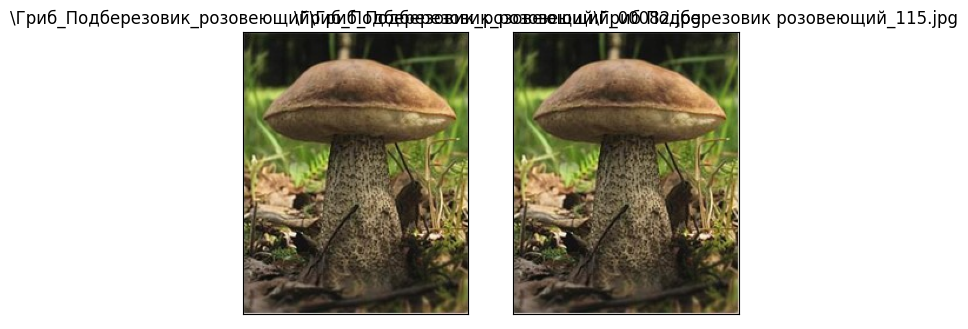

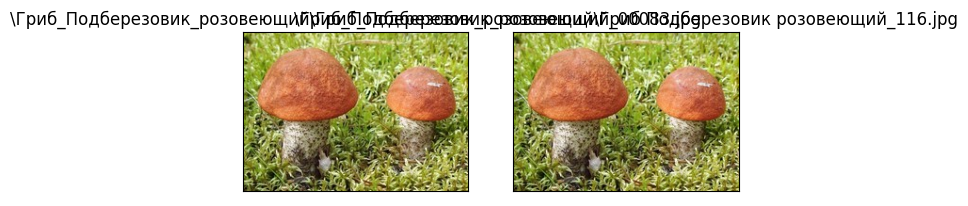

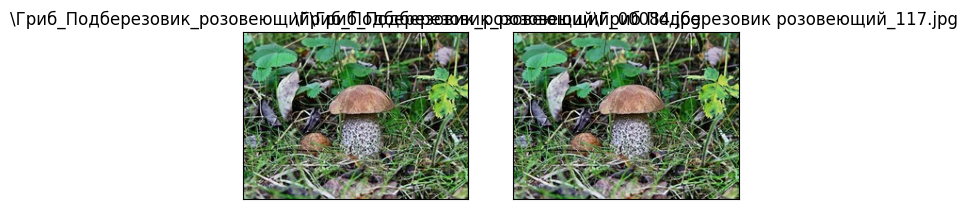

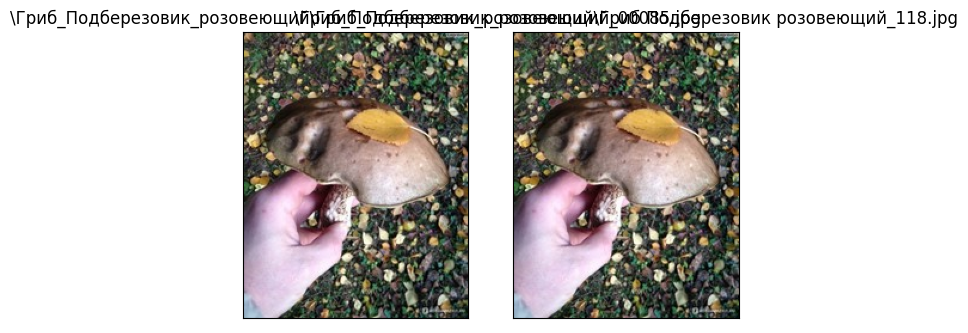

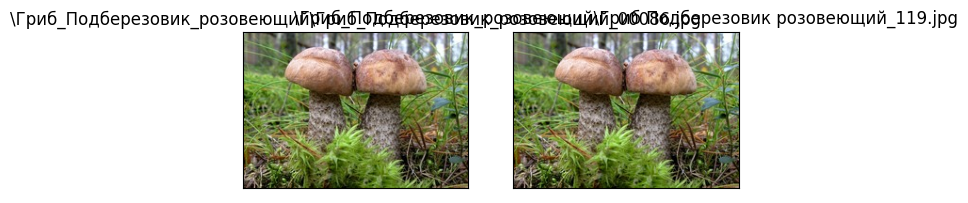

...

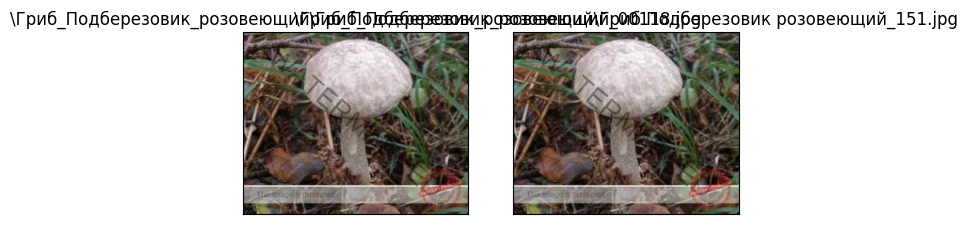

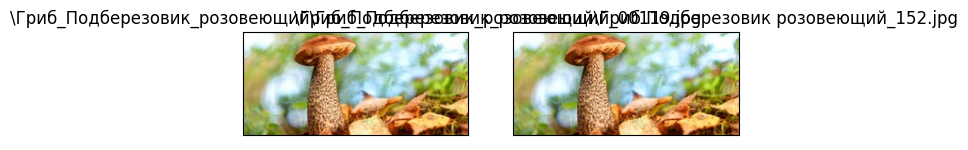

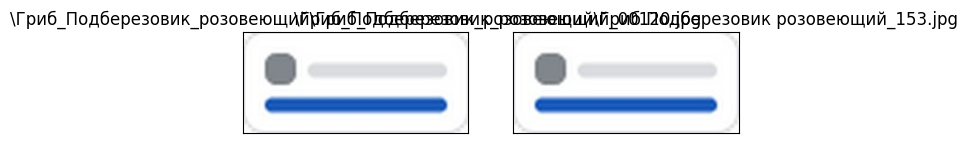

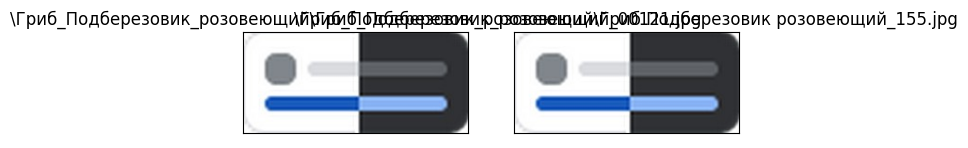

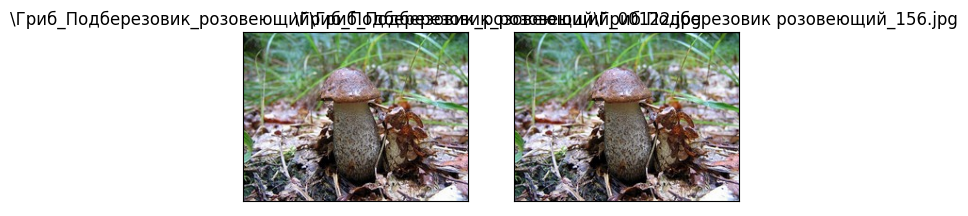

In [96]:
for file_indexes in dublicate[:50]:
    try:    
        plt.subplot(121),plt.imshow(imread(file_indexes[0]))        
        name = file_indexes[0].replace(r"c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced", "")
        plt.title(name), plt.xticks([]), plt.yticks([])

        plt.subplot(122),plt.imshow(imread(file_indexes[1]))
        name = file_indexes[1].replace(r"c:\Users\a.dubinets\Desktop\Обучение\Mushrooms\Dataset\procecced", "")
        plt.title(str(name)), plt.xticks([]), plt.yticks([])
        
        plt.show()
    
    except OSError as e:
        continue

In [97]:
for file_indexes in dublicate:    
    try:
        os.remove(file_indexes[0])
    except:    
        pass